In [1]:
import os
import glob
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse as sp
from scipy.stats import pearsonr
from tqdm import tqdm
import time
from collections import Counter
from matplotlib.patches import Patch

from scipy.cluster.hierarchy import linkage, fcluster
from collections import defaultdict

import rmm
import cupy
import cudf
import cupy as cp
import cvxpy as cpv
from rmm.allocators.cupy import rmm_cupy_allocator
from sklearn.feature_extraction.text import CountVectorizer
from cuml.linear_model import ElasticNet
import anndata as an
import scanpy as sc
import rapids_singlecell as rsc

import torch
from torchnmf.nmf import NMF

# Enable `managed_memory`
rmm.reinitialize(
    managed_memory=True,
    pool_allocator=False,
)
cp.cuda.set_allocator(rmm_cupy_allocator)

sc.settings.verbosity = 3

# Load our data

In [2]:
%%time
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/pseudotime.h5ad"
adata = sc.read_h5ad(fpath)
adata.X = adata.layers['raw_counts'].copy()
adata.obs['dataset'] = 'sample'
adata

CPU times: user 944 ms, sys: 3.29 s, total: 4.24 s
Wall time: 6.43 s


AnnData object with n_obs × n_vars = 15867 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str', 'barcoded_phase', 'S_score', 'G2M_score', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'nnz', 'dataset'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions',

In [3]:
%%time

agg = 'sum'
sdata = sc.get.aggregate(
    adata,
    by='cluster_str',
    func=agg,
    layer='raw_counts',
)

sdata.X = sdata.layers[agg]
sdata.obs['dataset'] = 'sample'
print(f"{sdata.shape=}")
sdata.obs.head()

sdata.shape=(5, 21412)
CPU times: user 158 ms, sys: 566 μs, total: 159 ms
Wall time: 161 ms


,cluster_str,dataset
C1,C1,sample
C2,C2,sample
C3,C3,sample
C4,C4,sample
C5,C5,sample


# Load Reference

In [4]:
%%time

# Load reference
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/cell_type_ref.h5ad"
rdata = sc.read_h5ad(fpath)
rdata.obs['dataset'] = 'reference'
rdata

CPU times: user 32.8 ms, sys: 44 ms, total: 76.8 ms
Wall time: 101 ms


AnnData object with n_obs × n_vars = 188 × 28538
    obs: 'cell_type', 'dataset'
    var: 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'

# Psuedobulk correlation analysis

In [5]:
%%time

print("-> GPU: rdata"); rsc.get.anndata_to_GPU(rdata)
print("-> GPU: sdata"); rsc.get.anndata_to_GPU(sdata)

print("-> Normalize/log: rdata")
rsc.pp.normalize_total(rdata, target_sum=1e4)
rsc.pp.log1p(rdata)
rsc.pp.highly_variable_genes(rdata)

print("-> Normalize/log: sdata")
rsc.pp.normalize_total(sdata, target_sum=1e4)
rsc.pp.log1p(sdata)
rsc.pp.highly_variable_genes(sdata)

gene_intersection = sorted(set(sdata.var_names) & set(rdata.var_names))
print(f"Genes in intersection: {len(gene_intersection)}")

sdata = sdata[:, gene_intersection].copy()
rdata = rdata[:, gene_intersection].copy()
adata = adata[:, gene_intersection].copy()

print("-> GPU: rdata"); rsc.get.anndata_to_CPU(rdata)
print("-> GPU: adata"); rsc.get.anndata_to_CPU(sdata)

print(f"Final adata shape: {sdata.shape=} {type(sdata)=}")
print(f"Final rdata shape: {rdata.shape=} {type(rdata)=}")
print(f"Final adata shape: {adata.shape=} {type(adata)=}")

-> GPU: rdata
-> GPU: sdata
-> Normalize/log: rdata
-> Normalize/log: sdata
Genes in intersection: 16609
-> GPU: rdata
-> GPU: adata
Final adata shape: sdata.shape=(5, 16609) type(sdata)=<class 'anndata._core.anndata.AnnData'>
Final rdata shape: rdata.shape=(188, 16609) type(rdata)=<class 'anndata._core.anndata.AnnData'>
Final adata shape: adata.shape=(15867, 16609) type(adata)=<class 'anndata._core.anndata.AnnData'>
CPU times: user 2.38 s, sys: 2.77 s, total: 5.15 s
Wall time: 5.71 s


[2025-06-06 09:04:03.783] [CUML] [info] Unused keyword parameter: random_state during cuML estimator initialization


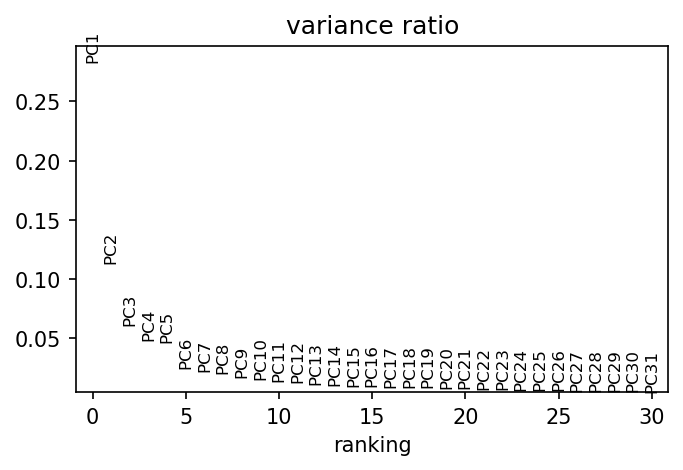

[2025-06-06 09:04:05.377] [CUML] [debug] n_neighbors=10
[2025-06-06 09:04:05.377] [CUML] [debug] Calling knn graph run
[2025-06-06 09:04:05.377] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-06-06 09:04:05.419] [CUML] [debug] Done. Calling remove zeros
leiden
1    32
4    32
0    23
7    21
8    21
3    20
2    17
5    17
6     5


In [6]:
rsc.pp.pca(rdata)

plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 5, 3
sc.pl.pca_variance_ratio(rdata)

rsc.pp.neighbors(rdata, n_neighbors=10)
rsc.tl.leiden(rdata)
rsc.tl.umap(rdata)

print(rdata.obs['leiden'].value_counts().to_string())

leiden                                                                                    top_ngrams
     0         (fibroblast, lung, muscle, smooth muscle, smooth, connective tissue, fibroblast lung)
     1          (progenitor, hematopoietic, stem, pre, thymocyte, hematopoietic stem, megakaryocyte)
     2           (fibroblast, endothelial, hepatic, mesothelial, kidney, lymphatic vessel, lymphoid)
     3                                        (alpha, beta, alpha beta, cd8, cd8 alpha, memory, cd4)
     4                                        (alpha, alpha beta, beta, cd4, cd4 alpha, innate, cd8)
     5  (dendritic, macrophage, myeloid, monocyte, myeloid dendritic, alveolar macrophage, alveolar)
     6                                   (plasma, iga, igg, iga plasma, igg plasma, igm, igm plasma)
     7                 (memory, center, switched, switched memory, germinal, class, germinal center)
     8 (endothelial, vessel, sinusoid, artery, capillary endothelial, capillary, vessel end

/tmp/ipykernel_81972/3813327573.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for k, g in df.groupby(group_col)


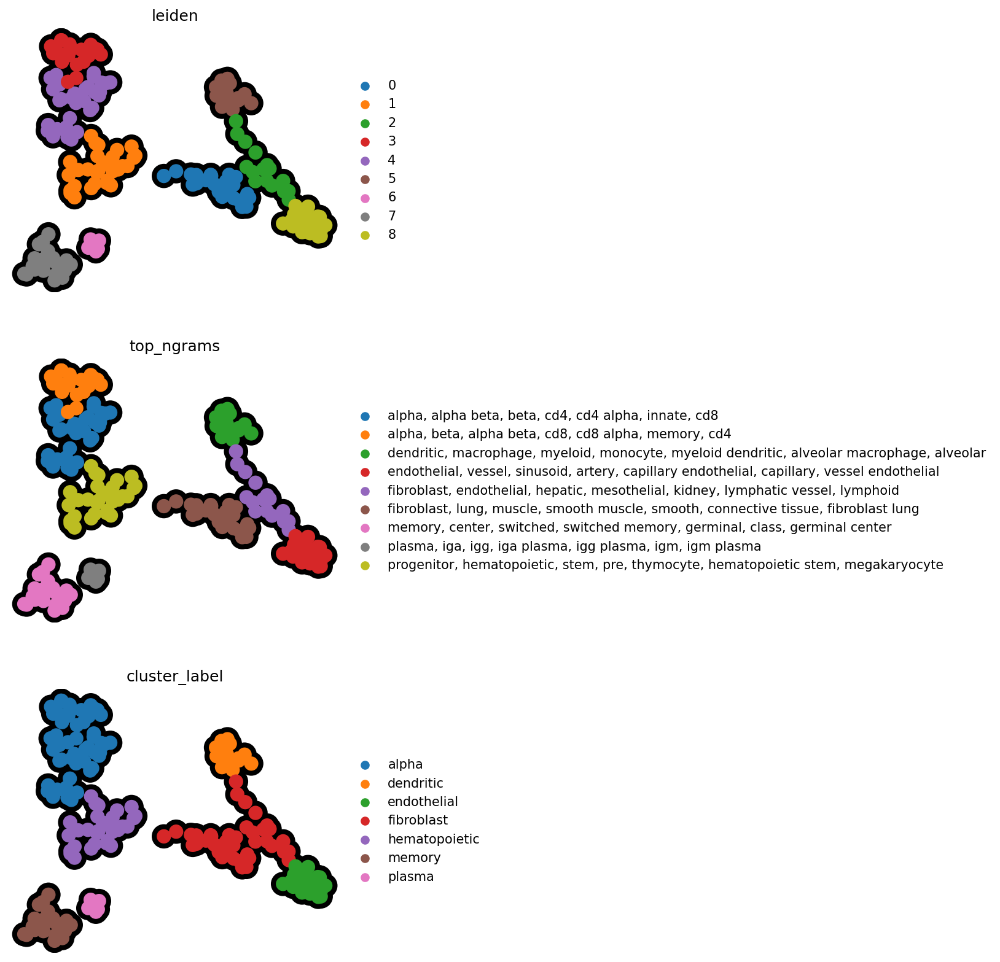

In [7]:
def cluster_top_ngrams(
    df, 
    group_col='leiden', 
    text_col='cell_type', 
    ngram_range=(1,3), 
    stop_words=None, 
    top_n=7
):
    """
    For each group in `group_col`, extract n-grams from `text_col`, remove n-grams
    common to all groups, and return a DataFrame with top n-grams per group.
    """
    # Extract n-grams per cluster
    def extract_ngrams(celltype_list):
        vec = CountVectorizer(ngram_range=ngram_range, stop_words=stop_words)
        X = vec.fit_transform(celltype_list)
        counts = X.sum(axis=0).A1
        ngrams = vec.get_feature_names_out()
        return pd.DataFrame({'ngram': ngrams, 'count': counts}).sort_values('count', ascending=False)
    
    ngram_tables = {
        k: extract_ngrams(g[text_col]) 
        for k, g in df.groupby(group_col)
    }
    
    # Find n-grams common to all clusters
    common = set.intersection(*(set(table['ngram']) for table in ngram_tables.values()))
    
    # Collect top n-grams per cluster, excluding common n-grams
    summary = []
    for k, table in ngram_tables.items():
        filtered = table[~table['ngram'].isin(common)]
        top = tuple(filtered['ngram'].head(top_n))
        summary.append({group_col: k, 'top_ngrams': top})
        
    return pd.DataFrame(summary).sort_values(group_col).reset_index(drop=True)

stop_words = ['cell', 'of', 'and', 'the', 'type', 'positive', 'negative', 'human']
summary_df = cluster_top_ngrams(
    rdata.obs.copy(),
    group_col='leiden',
    text_col='cell_type',
    ngram_range=(1,2),
    stop_words=stop_words,
    top_n=7
)
print(summary_df.to_string(index=False))

# 1. Make sure 'leiden' in rdata.obs matches type in summary_df
rdata.obs['leiden'] = rdata.obs['leiden'].astype(summary_df['leiden'].dtype)
ngram_map = summary_df.set_index('leiden')['top_ngrams'].to_dict()
rdata.obs['top_ngrams'] = rdata.obs['leiden'].map(ngram_map)
rdata.obs['top_ngrams'] = rdata.obs['top_ngrams'].apply(lambda x: ', '.join(x) if isinstance(x, tuple) else str(x))

# map the cell types
cluster_label_dict = {}

for idx, row in summary_df.iterrows():
    # Flatten all n-grams into 1-grams (split by whitespace)
    all_1grams = []
    for phrase in row['top_ngrams']:
        all_1grams.extend(phrase.split())
    # Count and select the most common 1-gram
    top_1gram = Counter(all_1grams).most_common(1)[0][0]
    cluster_label_dict[row['leiden']] = top_1gram

print(cluster_label_dict)
rdata.obs['cluster_label'] = rdata.obs['leiden'].map(cluster_label_dict)

cell2label = dict(zip(rdata.obs['cell_type'], rdata.obs['cluster_label']))

plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(
    rdata, 
    size=500,
    color=['leiden', 'top_ngrams', 'cluster_label'],
    ncols=1,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.25,
)

/tmp/ipykernel_81972/1025578629.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  X_grouped = X.groupby('cluster_label').mean()


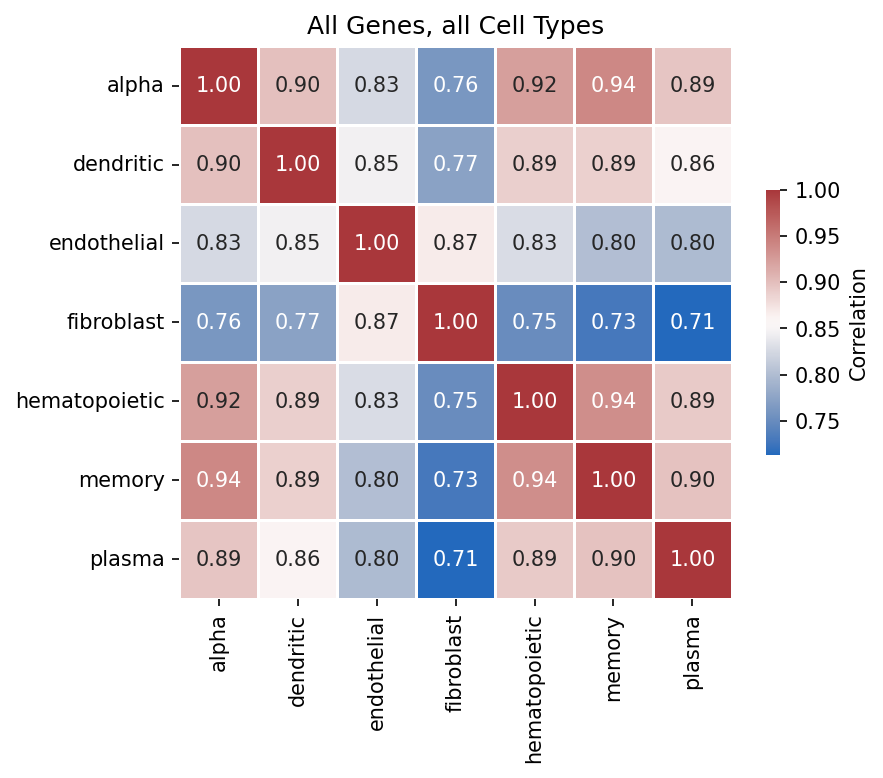

In [8]:
# Use the default AnnData index (obs_names) for X
X = pd.DataFrame(
    rdata.X,
    index=rdata.obs_names
)

X['cluster_label'] = rdata.obs['cluster_label'].values

# 1. Take mean PCA vector per cluster label
X_grouped = X.groupby('cluster_label').mean()

# 2. Correlation matrix (cluster_label × cluster_label)
corr = X_grouped.T.corr()

# 3. Plot
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 6, 6

sns.heatmap(
    corr,
    annot=True,
    cmap='vlag',
    square=True,
    linewidths=0.5,
    cbar_kws={'label': 'Correlation', 'shrink' : 0.35},
    fmt=".2f"
)
plt.title('All Genes, all Cell Types')
plt.ylabel('')
plt.xlabel('')
plt.tight_layout()
plt.show()

# Coarse Tissue classification (as in capybara)

In [9]:
# def select_mapped_types(
#     sdata, rdata, 
#     label_col='cell_type', 
#     threshold_pct=90, 
#     min_map_pct=0.7, 
#     min_freq=0.005
# ):
#     """
#     Identify reference tissues/cell types in rdata that are strongly mapped by sample cells in sdata.

#     Returns:
#         selected_tissues: list of tissues/cell_types passing criteria
#         summary_df: DataFrame with mapping stats for each tissue
#     """
#     def to_flat1d(x):
#         # Sparse matrix row (csr, csc): shape (1, n) or (n,)
#         if hasattr(x, "A1"):
#             return x.A1
#         elif hasattr(x, "toarray"):
#             return x.toarray().ravel()
#         else:
#             return np.ravel(x)
#     # Step 1: Extract expression matrices
#     X_sample = sdata.X
#     X_reference = rdata.X

#     # Step 2: Compute Pearson correlation for each reference cell vs each sample cell
#     corr_matrix = np.zeros((rdata.n_obs, sdata.n_obs))
#     for i in tqdm(range(rdata.n_obs), desc="Reference cells"):
#         for j in range(sdata.n_obs):
#             ref_vec = to_flat1d(X_reference[i,:])
#             samp_vec = to_flat1d(X_sample[j,:])
#             corr_matrix[i, j], _ = pearsonr(ref_vec, samp_vec)

#     # Step 3: Binarize correlation matrix using threshold percentile
#     threshold = np.percentile(corr_matrix, threshold_pct)
#     print(f"Percentile ({threshold_pct}% = {threshold:.4f})")
#     bin_matrix = (corr_matrix > threshold).astype(int)

#     # Step 4: For each tissue/cell type, compute mapping statistics
#     ref_labels = rdata.obs[label_col].values
#     sample_n = sdata.n_obs
#     results = []
#     for tissue in np.unique(ref_labels):
#         tissue_idx = np.where(ref_labels == tissue)[0]
#         n_reference_cells = len(tissue_idx)
#         n_sample_cells = sample_n

#         n_mapped = bin_matrix[tissue_idx].sum(axis=0)  # For each sample cell, count reference cells that map to it
#         pct_mapped = n_mapped / n_reference_cells      # Fraction of reference cells per sample cell

#         n_above = (pct_mapped > min_map_pct).sum()
#         freq = n_above / n_sample_cells

#         # Add summary stats
#         mean_pct = pct_mapped.mean()
#         median_pct = np.median(pct_mapped)
#         max_pct = pct_mapped.max()
#         min_pct = pct_mapped.min()

#         # Subset the relevant part of the correlation matrix
#         corr_vals = corr_matrix[tissue_idx, :].flatten()
#         mean_corr = corr_vals.mean()
#         median_corr = np.median(corr_vals)
#         min_corr = corr_vals.min()
#         max_corr = corr_vals.max()

#         results.append({
#             'cell_type': tissue,
#             'n_reference_cells': n_reference_cells,
#             'n_sample_cells': n_sample_cells,
#             'mean_pct_mapped': pct_mapped.mean(),
#             'median_pct_mapped': np.median(pct_mapped),
#             'max_pct_mapped': pct_mapped.max(),
#             'min_pct_mapped': pct_mapped.min(),
#             'freq': freq,
#             'n_above': n_above,
#             # --- Correlation info ---
#             'mean_corr': mean_corr,
#             'median_corr': median_corr,
#             'min_corr': min_corr,
#             'max_corr': max_corr,
#         })

#     summary_df = pd.DataFrame(results)
#     summary_df['selected'] = (summary_df['freq'] >= min_freq)
#     selected_tissues = summary_df[summary_df['selected']]['cell_type'].tolist()
#     return selected_tissues, summary_df


# selected_types, stats = select_mapped_types(sdata, rdata, min_map_pct=0.9,)
# print(f"{len(selected_types)=}")
# selected_types

In [10]:
def select_mapped_types(
    sdata, rdata, 
    label_col='cell_type', 
    threshold_pct=90, 
    min_freq=0.005,
    verbose=False,
):
    """
    Identify reference cell types in rdata that are strongly mapped by sample cells in sdata.

    Returns:
        selected_cell_types: list of cell_types passing criteria
        summary_df: DataFrame with mapping stats for each cell_type
    """
    def to_flat1d(x):
        # Converts row to flat array
        if hasattr(x, "A1"):
            return x.A1
        elif hasattr(x, "toarray"):
            return x.toarray().ravel()
        else:
            return np.ravel(x)

    # Step 1: Extract expression matrices
    X_sample = sdata.X
    X_reference = rdata.X

    # Step 2: Compute Pearson correlation for each reference cell vs each sample cell
    corr_matrix = np.zeros((rdata.n_obs, sdata.n_obs))
    if verbose:
        for i in tqdm(range(rdata.n_obs), desc="Reference cells"):
            for j in range(sdata.n_obs):
                ref_vec = to_flat1d(X_reference[i,:])
                samp_vec = to_flat1d(X_sample[j,:])
                corr_matrix[i, j], _ = pearsonr(ref_vec, samp_vec)
    else:
        for i in range(rdata.n_obs):
            for j in range(sdata.n_obs):
                ref_vec = to_flat1d(X_reference[i,:])
                samp_vec = to_flat1d(X_sample[j,:])
                corr_matrix[i, j], _ = pearsonr(ref_vec, samp_vec)

    # Step 3: Binarize correlation matrix using threshold percentile
    threshold = np.percentile(corr_matrix, threshold_pct)
    if verbose:
        print(f"Percentile ({threshold_pct}% = {threshold:.4f})")
    bin_matrix = (corr_matrix > threshold).astype(int)

    # Step 4: For each cell type, compute mapping statistics
    ref_labels = rdata.obs[label_col].values
    sample_n = sdata.n_obs
    results = []
    for cell_type in np.unique(ref_labels):
        celltype_idx = np.where(ref_labels == cell_type)[0]
        n_reference_cells = len(celltype_idx)
        n_sample_cells = sample_n

        # For each sample cell, count the number of reference cells in this cell type that are mapped
        n_mapped = bin_matrix[celltype_idx].sum(axis=0)
        pct_mapped = n_mapped / n_reference_cells

        # Instead of thresholding, just use the mean fraction mapped as freq
        freq = (pct_mapped > 0).sum() / n_sample_cells

        # Summary stats
        mean_pct = pct_mapped.mean()
        median_pct = np.median(pct_mapped)
        max_pct = pct_mapped.max()
        min_pct = pct_mapped.min()

        # Correlation matrix stats for this cell type
        corr_vals = corr_matrix[celltype_idx, :].flatten()
        mean_corr = corr_vals.mean()
        median_corr = np.median(corr_vals)
        min_corr = corr_vals.min()
        max_corr = corr_vals.max()

        results.append({
            'cell_type': cell_type,
            'n_reference_cells': n_reference_cells,
            'n_sample_cells': n_sample_cells,
            'mean_pct_mapped': mean_pct,
            'median_pct_mapped': median_pct,
            'max_pct_mapped': max_pct,
            'min_pct_mapped': min_pct,
            'freq': freq,
            # --- Correlation info ---
            'mean_corr': mean_corr,
            'median_corr': median_corr,
            'min_corr': min_corr,
            'max_corr': max_corr,
        })

    summary_df = pd.DataFrame(results)
    summary_df['selected'] = (summary_df['freq'] >= min_freq)
    selected_cell_types = summary_df[summary_df['selected']]['cell_type'].tolist()
    return selected_cell_types, summary_df

# Usage
selected_types, stats = select_mapped_types(sdata, rdata, verbose=True,)
print(f"{len(selected_types)=}")
selected_types

Reference cells: 100%|██████████| 188/188 [00:00<00:00, 387.71it/s]


Percentile (90% = 0.7333)
len(selected_types)=35


['activated CD4-positive, alpha-beta T cell',
 'activated CD8-positive, alpha-beta T cell',
 'alveolar type 2 fibroblast cell',
 'bronchus fibroblast of lung',
 'common dendritic progenitor',
 'common myeloid progenitor',
 'double negative thymocyte',
 'early lymphoid progenitor',
 'embryonic fibroblast',
 'endothelial cell of lymphatic vessel',
 'endothelial cell of periportal hepatic sinusoid',
 'endothelial cell of placenta',
 'endothelial cell of uterus',
 'endothelial cell of venule',
 'eosinophil',
 'fibroblast',
 'fibroblast of connective tissue of glandular part of prostate',
 'fibroblast of lung',
 'fibroblast of mammary gland',
 'fraction A pre-pro B cell',
 'granulocyte monocyte progenitor cell',
 'hematopoietic cell',
 'hematopoietic multipotent progenitor cell',
 'hematopoietic precursor cell',
 'lymphocyte',
 'megakaryocyte',
 'megakaryocyte-erythroid progenitor cell',
 'mesenchymal cell',
 'mural cell',
 'myofibroblast cell',
 'plasmablast',
 'prostate gland microvascula

In [11]:
stats['cluster_label'] = stats['cell_type'].map(cell2label)
stats[stats['selected']]['cluster_label'].value_counts()

cluster_label
fibroblast       13
hematopoietic    11
endothelial       6
alpha             3
dendritic         1
plasma            1
Name: count, dtype: int64

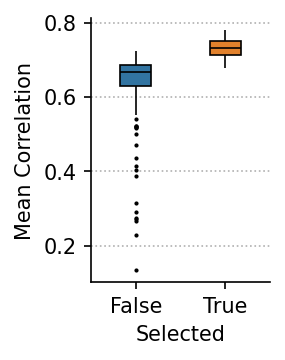

In [12]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 2, 2.5

ax = sns.boxplot(
    data=stats,
    x='selected',
    y='mean_corr',
    hue='selected',
    width=0.35,
    linecolor='k',
    capprops={'linewidth': 0},
    linewidth=0.8,
    flierprops={'markersize': 1},
)

ax.grid(axis='y', linestyle=":")
sns.despine(ax=ax)
ax.set_xlabel("Selected")
ax.set_ylabel("Mean Correlation")
ax.legend_.remove()
plt.tight_layout()
plt.show()


# Sensitivity of Selections

Sensitivity loop: 100%|██████████| 25/25 [00:12<00:00,  1.96it/s]


Text(0.5, 0, 'Binarization Threshold')

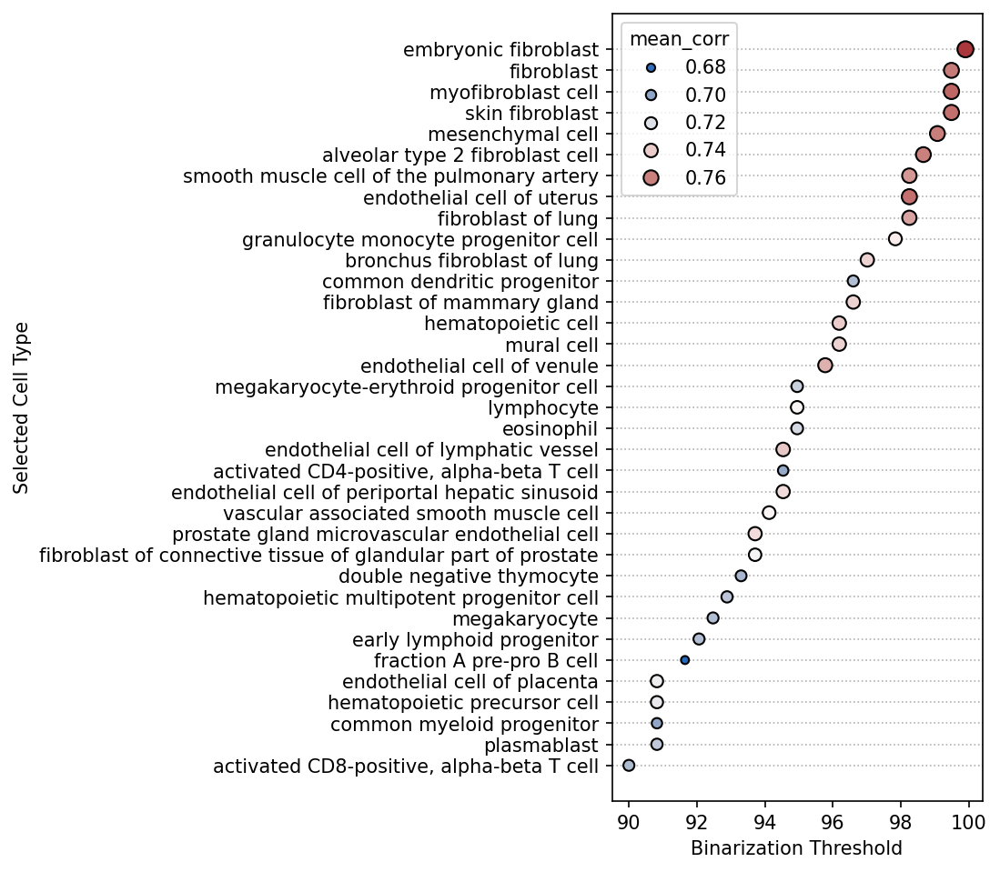

In [13]:
results = []

steps = 25 
for threshold_perc in tqdm(np.linspace(90, 99.9, steps), 'Sensitivity loop'):
    selected_types, stats = select_mapped_types(
        sdata, rdata, 
        label_col='cell_type', 
        threshold_pct=threshold_perc, 
        verbose=False,
    )
    stats['threshold_perc'] = threshold_perc
    results.append(stats)

results = pd.concat(results)     
results['threshold_perc'] = results['threshold_perc'].astype(float)
results = results[results['selected']]

results = results.groupby(['cell_type', 'mean_corr'])['threshold_perc'].max().reset_index()
results = results.sort_values(by='threshold_perc', ascending=False)

plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 3.5, 7.5

ax = sns.scatterplot(
    data=results,
    y='cell_type',
    x='threshold_perc',
    hue='mean_corr',
    palette='vlag',
    size='mean_corr',
    ec='k',
    lw=1,
    zorder=3
)

ax.grid(axis='y', linestyle=":", zorder=0)
ax.set_ylabel("Selected Cell Type")
ax.set_xlabel("Binarization Threshold")

# Plot selected corr by cluster

sdata.shape=(5, 16609) type(sdata)=<class 'anndata._core.anndata.AnnData'>
rdata.shape=(188, 16609) type(rdata)=<class 'anndata._core.anndata.AnnData'>
len(selected_types)=35


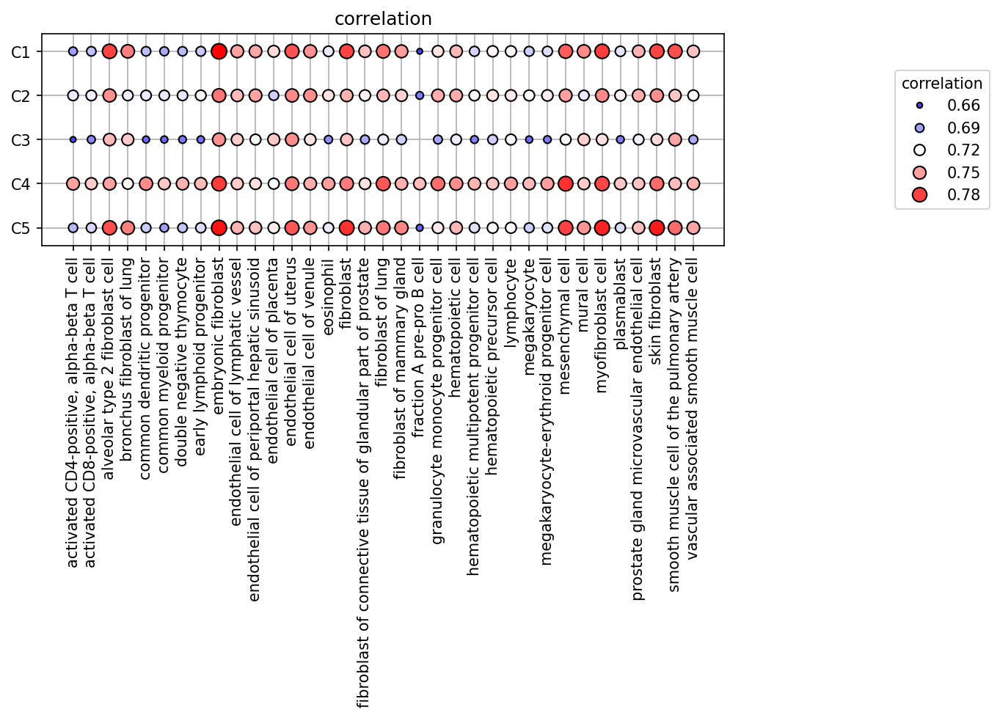

In [14]:
print(f"{sdata.shape=} {type(sdata)=}")
print(f"{rdata.shape=} {type(rdata)=}")

selected_types, stats = select_mapped_types(sdata, rdata, verbose=False)
print(f"{len(selected_types)=}")

# Subset rdata
mask = rdata.obs['cell_type'].isin(selected_types)
r_sub = rdata[mask, :]

# Convert to cupy arrays
Xr = cp.array(r_sub.X)
Xs = cp.array(sdata.X)

# Standardize rows
Xs_std = (Xs - Xs.mean(axis=1, keepdims=True)) / Xs.std(axis=1, keepdims=True)
Xr_std = (Xr - Xr.mean(axis=1, keepdims=True)) / Xr.std(axis=1, keepdims=True)

# Correlation matrix: rows=r_sub, columns=sdata
corr = Xr_std @ Xs_std.T / Xs_std.shape[1]

# Convert to pandas DataFrame (move data to CPU)
corr_df = pd.DataFrame(
    corr.get(),
    index=r_sub.obs_names,
    columns=sdata.obs_names
)

corr_df = corr_df.reset_index().melt(
    id_vars='index',
    var_name='sdata_obs',
    value_name='correlation'
).rename(columns={'index': 'rdata_obs'})


plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 8, 2.5

sns.scatterplot(
    corr_df,
    x='rdata_obs',
    y='sdata_obs',
    size='correlation',
    hue='correlation',
    ec='k',
    lw=1,
    palette='bwr',
    sizes=(0, 100),
    zorder=5,
)

plt.grid(True)
plt.ylabel("")
plt.xlabel("")
plt.title('correlation')
plt.gca().tick_params(axis='x', rotation=90)
plt.margins(y=0.1)
sns.move_legend(
    plt.gca(),
    loc='center right',
    bbox_to_anchor=(1.4, 0.5)
)


sdata.shape=(5, 16609) type(sdata)=<class 'anndata._core.anndata.AnnData'>
rdata.shape=(188, 16609) type(rdata)=<class 'anndata._core.anndata.AnnData'>
len(selected_types)=35


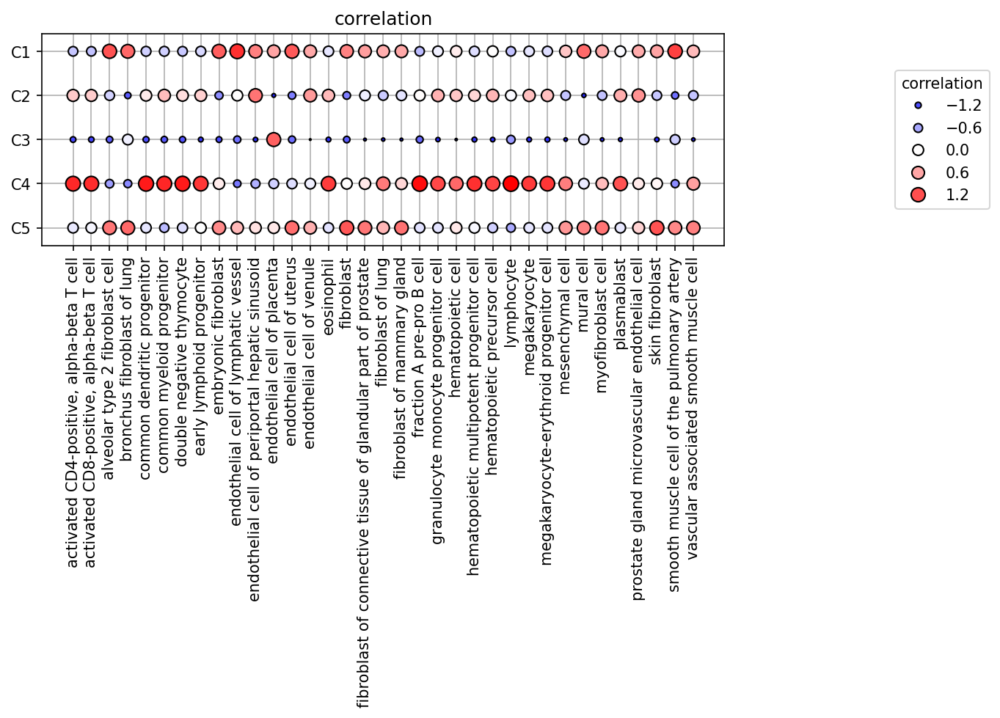

In [15]:
print(f"{sdata.shape=} {type(sdata)=}")
print(f"{rdata.shape=} {type(rdata)=}")

selected_types, stats = select_mapped_types(sdata, rdata, verbose=False)
print(f"{len(selected_types)=}")

# Subset rdata
mask = rdata.obs['cell_type'].isin(selected_types)
r_sub = rdata[mask, :]

# Convert to cupy arrays
Xr = cp.array(r_sub.X)
Xs = cp.array(sdata.X)

# Standardize rows
Xs_std = (Xs - Xs.mean(axis=1, keepdims=True)) / Xs.std(axis=1, keepdims=True)
Xr_std = (Xr - Xr.mean(axis=1, keepdims=True)) / Xr.std(axis=1, keepdims=True)

# Correlation matrix: rows=r_sub, columns=sdata
corr = Xr_std @ Xs_std.T / Xs_std.shape[1]

# Convert to pandas DataFrame (move data to CPU)
corr_df = pd.DataFrame(
    corr.get(),
    index=r_sub.obs_names,
    columns=sdata.obs_names
)

corr_df = (corr_df.subtract(corr_df.mean(axis=1), axis=0)
                ).divide(corr_df.std(axis=1), axis=0)


corr_df = corr_df.reset_index().melt(
    id_vars='index',
    var_name='sdata_obs',
    value_name='correlation'
).rename(columns={'index': 'rdata_obs'})


plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 8, 2.5

sns.scatterplot(
    corr_df,
    x='rdata_obs',
    y='sdata_obs',
    size='correlation',
    hue='correlation',
    ec='k',
    lw=1,
    palette='bwr',
    sizes=(0, 100),
    zorder=5,
)

plt.grid(True)
plt.ylabel("")
plt.xlabel("")
plt.title('correlation')
plt.gca().tick_params(axis='x', rotation=90)
plt.margins(y=0.1)
sns.move_legend(
    plt.gca(),
    loc='center right',
    bbox_to_anchor=(1.4, 0.5)
)


# Selected Cell Types are Highly Correlated with One-another

This means that they are potentially "competing" to explain the same expression patterns in the target cell type.

Reference cells: 100%|██████████| 188/188 [00:00<00:00, 385.30it/s]


Percentile (90% = 0.7333)
len(selected_types)=35
Mean correlation between selected cell types: 0.8163


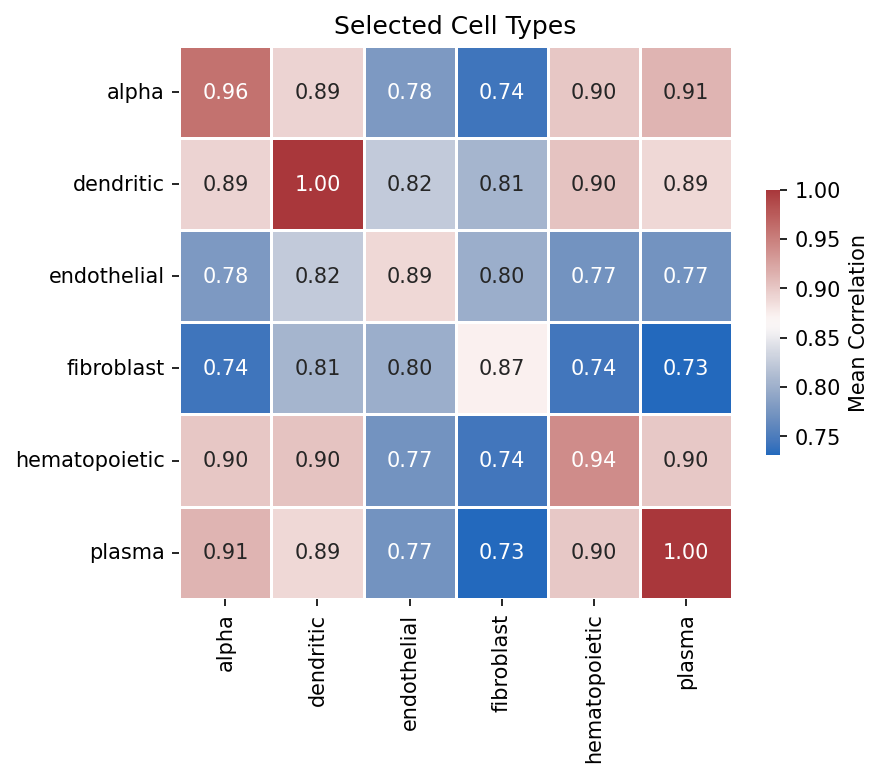

CPU times: user 828 ms, sys: 65.7 ms, total: 894 ms
Wall time: 899 ms


In [16]:
%%time
selected_types, stats = select_mapped_types(sdata, rdata, verbose=True)
print(f"{len(selected_types)=}")

X = rdata[rdata.obs['cell_type'].isin(selected_types), :].to_df()
corr = X.T.corr()
print(f"Mean correlation between selected cell types: {np.mean(corr):.4f}")

corr = corr.reset_index()
corr = pd.melt(corr, id_vars='index')
corr['index'] = corr['index'].map(cell2label)
corr['variable'] = corr['variable'].map(cell2label)
corr = corr.groupby(['index', 'variable'])['value'].mean().reset_index()
corr = pd.pivot_table(
    corr, index='index',
    columns='variable',
    values='value',
)

# 3. Plot
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 6, 6

sns.heatmap(
    corr,
    annot=True,
    cmap='vlag',
    square=True,
    linewidths=0.5,
    cbar_kws={'label': 'Mean Correlation', 'shrink' : 0.35},
    fmt=".2f"
)
plt.title('Selected Cell Types')
plt.ylabel('')
plt.xlabel('')
plt.tight_layout()
plt.show()

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


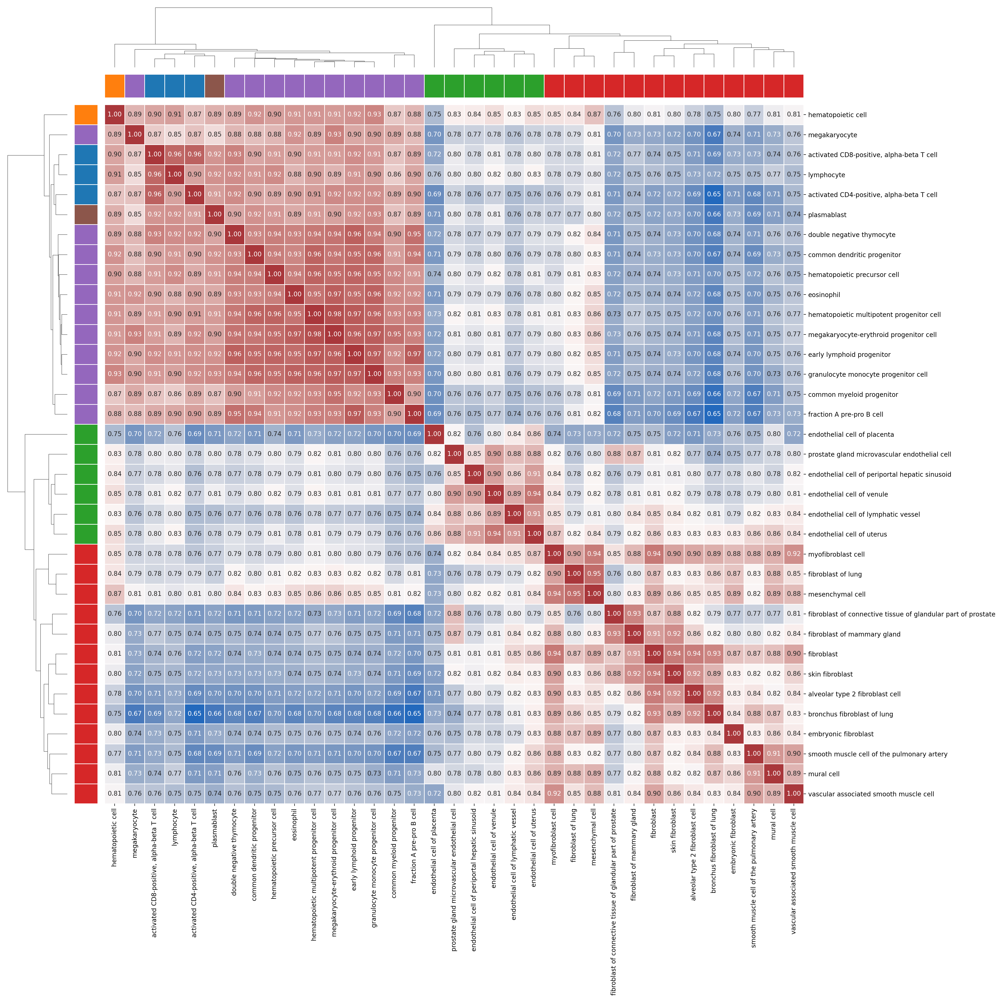

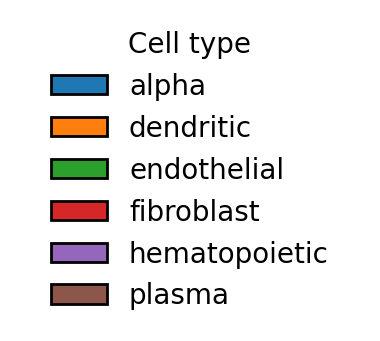

CPU times: user 4.18 s, sys: 967 ms, total: 5.15 s
Wall time: 5.18 s


In [17]:
%%time
X = rdata[rdata.obs['cell_type'].isin(selected_types), :].to_df()
corr = X.T.corr()

# get colors
row_values = corr.index.map(cell2label)
unique_row_values = sorted(set(row_values))
palette = sns.color_palette('tab10', n_colors=len(unique_row_values))
row_color_dict = dict(zip(unique_row_values, palette))
row_colors = [row_color_dict[v] for v in row_values]

plt.rcParams['figure.dpi'] = 200

sns.clustermap(
    corr,
    row_colors=row_colors,
    col_colors=row_colors,
    annot=True,
    cmap='vlag',
    square=True,
    figsize=(22, 22),
    linewidths=0.5,
    cbar_pos=None,
    dendrogram_ratio=(0.08, 0.08),  # Smaller dendrograms (row, col)
    fmt=".2f"
)
plt.ylabel('')
plt.xlabel('')
plt.tight_layout()
plt.show()

# Your unique categories and their colors
legend_labels = unique_row_values  # e.g., ['alpha', 'dendritic', 'endothelial', ...]
legend_colors = [row_color_dict[v] for v in legend_labels]

# Build legend handles
handles = [Patch(facecolor=color, edgecolor='black', label=label)
           for label, color in zip(legend_labels, legend_colors)]

# Plot standalone legend
fig, ax = plt.subplots(figsize=(2, len(handles) * 0.3))
ax.axis('off')  # Hide axes
legend = ax.legend(
    handles=handles,
    loc='center',
    frameon=False,
    ncol=1,
    title="Cell type"
)
plt.tight_layout()
plt.show()

# Sparse Linear Fit of Target Profiles Using Reference Profiles

Given:

- $\mathbf{X}_{\text{ref}} \in \mathbb{R}^{n_{\text{ref}} \times g}$:  
  Expression matrix of reference cells (rows = cells, columns = genes), from `rdata`.
- $\mathbf{X}_{\text{target}} \in \mathbb{R}^{n_{\text{target}} \times g}$:  
  Expression matrix of target cells (rows = cells, columns = genes), from `sdata`.
- $C_{\text{ref}}$:  
  Cell type annotation for each reference cell.

**Goal:**  
For each target cell $j$ ($1 \leq j \leq n_{\text{target}}$), find a sparse vector of weights $\mathbf{w}_j \in \mathbb{R}^{n_{\text{ref}}}$ such that:

$$
\mathbf{x}_{\text{target},j} \approx \mathbf{X}_{\text{ref}}^\top \mathbf{w}_j
$$

where $\mathbf{x}_{\text{target},j}$ is the gene expression profile of target cell $j$.

**Optimization (Lasso/ElasticNet regression):**

For each target cell $j$, solve:

$$
\mathbf{w}_j = \underset{\mathbf{w}}{\arg\min} \; \left\| \mathbf{x}_{\text{target},j} - \mathbf{X}_{\text{ref}}^\top \mathbf{w} \right\|_2^2 + \alpha \|\mathbf{w}\|_1
$$

where:
- $\alpha$ controls sparsity (higher = sparser).
- $\|\mathbf{w}\|_1$ is the L1 norm.

**Result:**  
- $\mathbf{w}_j$ encodes the contribution of each reference cell to target cell $j$.
- The solution is **sparse**: most weights are zero.
- Each weight can be annotated with the reference cell's type, enabling downstream summaries (e.g., sum/mean of weights by cell type).

NOTE:
Use of this penalty function has several limitations. For example, in the "large p, small n" case (high-dimensional data with few examples), the LASSO selects at most n variables before it saturates. Also if there is a group of highly correlated variables, then the LASSO tends to select one variable from a group and ignore the others. 

In [18]:
%%time
def fit_elasticnet_deconvolution(
    rdata, sdata,
    alpha=0.1,
    l1_ratio=0.75,
    fit_intercept=False,
    max_iter=1000
):
    """
    Fit ElasticNet models to deconvolve each sample in sdata using rdata as reference.

    Returns:
        weights_df: DataFrame [cells x ref_cell_types] of weights
        errors: list of MSEs for each cell
    """
    # Reference matrix and metadata
    R = rdata.X.toarray() if hasattr(rdata.X, "toarray") else np.array(rdata.X)
    ref_cell_types = rdata.obs['cell_type'].tolist()
    # Target matrix
    A = sdata.X.toarray() if hasattr(sdata.X, "toarray") else np.array(sdata.X)
    target_names = sdata.obs_names.tolist()

    weights = []
    errors = []

    for i in range(A.shape[0]):
        x = A[i]
        model = ElasticNet(
            alpha=alpha,
            l1_ratio=l1_ratio,
            fit_intercept=fit_intercept,
            max_iter=max_iter
        )
        model.fit(R.T, x)
        w = model.coef_
        weights.append(w)
        x_pred = np.dot(R.T, w)
        mse = np.mean((x - x_pred) ** 2)
        errors.append(mse)

    weights_df = pd.DataFrame(weights, columns=ref_cell_types, index=target_names)
    return weights_df, errors

weights_df, errors = fit_elasticnet_deconvolution(rdata, sdata)
print(f"{weights_df.shape=} {len(errors)}")
weights_df

weights_df.shape=(5, 188) 5
CPU times: user 4.93 s, sys: 38.1 ms, total: 4.97 s
Wall time: 1.84 s


,B-1 B cell,B-1a B cell,B-1b B cell,B-2 B cell,CD1c-positive myeloid dendritic cell,CD4-positive helper T cell,"CD4-positive, CD25-positive, alpha-beta regulatory T cell","CD4-positive, alpha-beta cytotoxic T cell","CD4-positive, alpha-beta memory T cell","CD4-positive, alpha-beta thymocyte",...,skeletal muscle fibroblast,skin fibroblast,small pre-B-II cell,smooth muscle cell of the pulmonary artery,thymocyte,tonsil germinal center B cell,transitional stage B cell,unswitched memory B cell,vascular associated smooth muscle cell,vein endothelial cell
C1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.055882,0.0,0.071083,0.0,0.0,0.0,0.0,0.0,0.0
C2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.051491,0.0,0.039448,0.0,0.0,0.0,0.0,0.0,0.0
C3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.002483,0.0,0.061172,0.0,0.0,0.0,0.0,0.0,0.0
C4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.062868,0.0,0.016059,0.0,0.0,0.0,0.0,0.0,0.0
C5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.104135,0.0,0.047489,0.0,0.0,0.0,0.0,0.0,0.0


plot_df.shape=(21, 5)


/tmp/ipykernel_81972/167903226.py:21: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


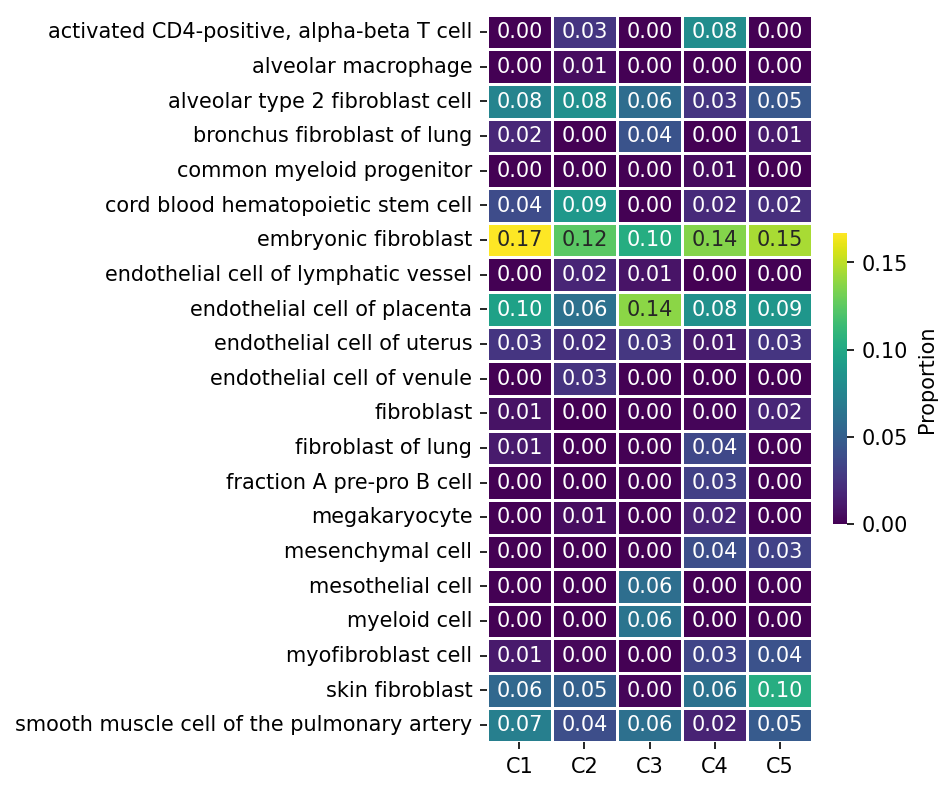

['activated CD4-positive, alpha-beta T cell',
 'alveolar macrophage',
 'alveolar type 2 fibroblast cell',
 'bronchus fibroblast of lung',
 'common myeloid progenitor',
 'cord blood hematopoietic stem cell',
 'embryonic fibroblast',
 'endothelial cell of lymphatic vessel',
 'endothelial cell of placenta',
 'endothelial cell of uterus',
 'endothelial cell of venule',
 'fibroblast',
 'fibroblast of lung',
 'fraction A pre-pro B cell',
 'megakaryocyte',
 'mesenchymal cell',
 'mesothelial cell',
 'myeloid cell',
 'myofibroblast cell',
 'skin fibroblast',
 'smooth muscle cell of the pulmonary artery']

In [19]:
plot_df = weights_df.T.copy()
threshold = 0.001
plot_df = plot_df.loc[(plot_df > threshold).any(axis=1)]
print(f"{plot_df.shape=}")

plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 3.5, len(plot_df) * 0.3

sns.heatmap(
    plot_df,
    annot=True,
    fmt=".2f",
    cmap="viridis",
    linewidths=0.5,
    linecolor='w',
    cbar_kws={'label': 'Proportion', 'shrink' : 0.4},
)

plt.xlabel("")
plt.ylabel("")
plt.tight_layout()
plt.show()

plot_df.index.to_list()

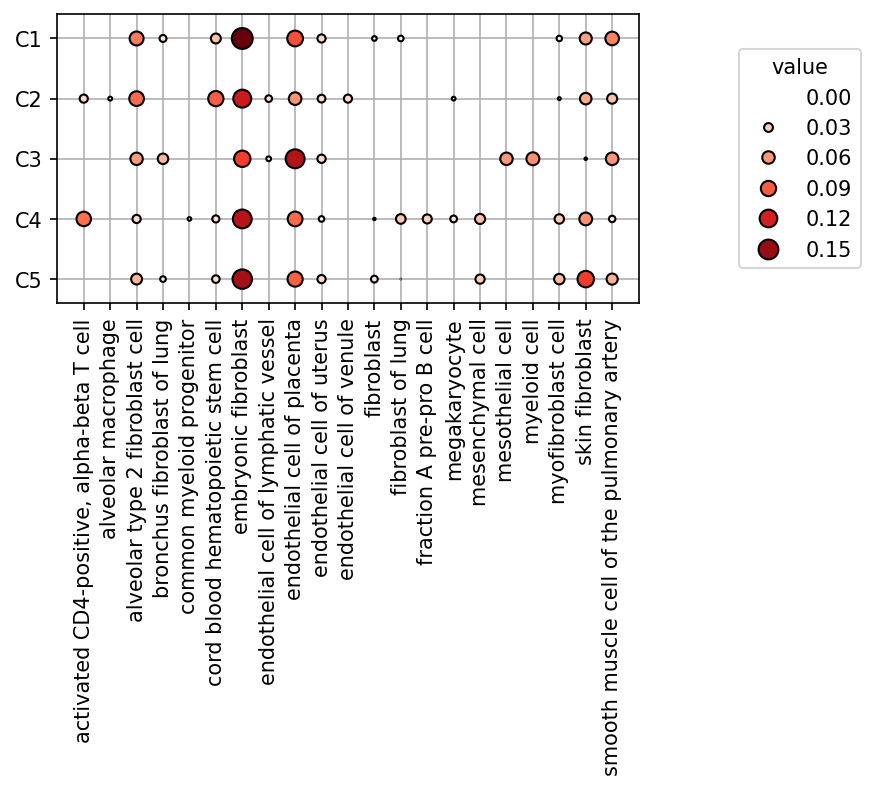

In [20]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 5, 2.5

sns.scatterplot(
    pd.melt(plot_df.reset_index(), id_vars='index'),
    x='index',
    y='variable',
    size='value',
    hue='value',
    ec='k',
    lw=1,
    palette='Reds',
    sizes=(0, 100),
    zorder=5,
)
plt.ylabel("")
plt.xlabel("")
plt.gca().tick_params(axis='x', rotation=90)
plt.margins(y=0.1)
sns.move_legend(
    plt.gca(),
    loc='center right',
    bbox_to_anchor=(1.4, 0.5)
)
plt.grid(True)

In [21]:
# Find overlap between selected_types and plot_df.index.to_list()
selected_types, stats = select_mapped_types(sdata, rdata)

selected_types_set = set(selected_types)
plot_types_set = set(plot_df.index.to_list())

overlap = selected_types_set & plot_types_set

union_of_all = selected_types_set | plot_types_set

print("===== Type Overlap Report =====")
print(f"N Capybara Selected Types:        {len(selected_types_set)}")
print(f"N ElasticNet Selected Types:            {len(plot_types_set)}")
print(f"Number overlapping:    {len(overlap)}")

print("\nTypes overlapping in both selection criteria:")
for t in sorted(overlap):
    print(f"  - {t}")

not_in_plot = sorted(selected_types_set - plot_types_set)
not_in_selected = sorted(plot_types_set - selected_types_set)

print("\nTypes selected by Capybara, but not ElasticNet:")
for t in not_in_plot:
    print(f"  - {t}")

print("\nTypes selected by ElasticNet, but Capybara:")
for t in not_in_selected:
    print(f"  - {t}")

===== Type Overlap Report =====
N Capybara Selected Types:        35
N ElasticNet Selected Types:            21
Number overlapping:    17

Types overlapping in both selection criteria:
  - activated CD4-positive, alpha-beta T cell
  - alveolar type 2 fibroblast cell
  - bronchus fibroblast of lung
  - common myeloid progenitor
  - embryonic fibroblast
  - endothelial cell of lymphatic vessel
  - endothelial cell of placenta
  - endothelial cell of uterus
  - endothelial cell of venule
  - fibroblast
  - fibroblast of lung
  - fraction A pre-pro B cell
  - megakaryocyte
  - mesenchymal cell
  - myofibroblast cell
  - skin fibroblast
  - smooth muscle cell of the pulmonary artery

Types selected by Capybara, but not ElasticNet:
  - activated CD8-positive, alpha-beta T cell
  - common dendritic progenitor
  - double negative thymocyte
  - early lymphoid progenitor
  - endothelial cell of periportal hepatic sinusoid
  - eosinophil
  - fibroblast of connective tissue of glandular part of pr

len(selected_types)=21
Mean correlation between selected cell types: 0.7886


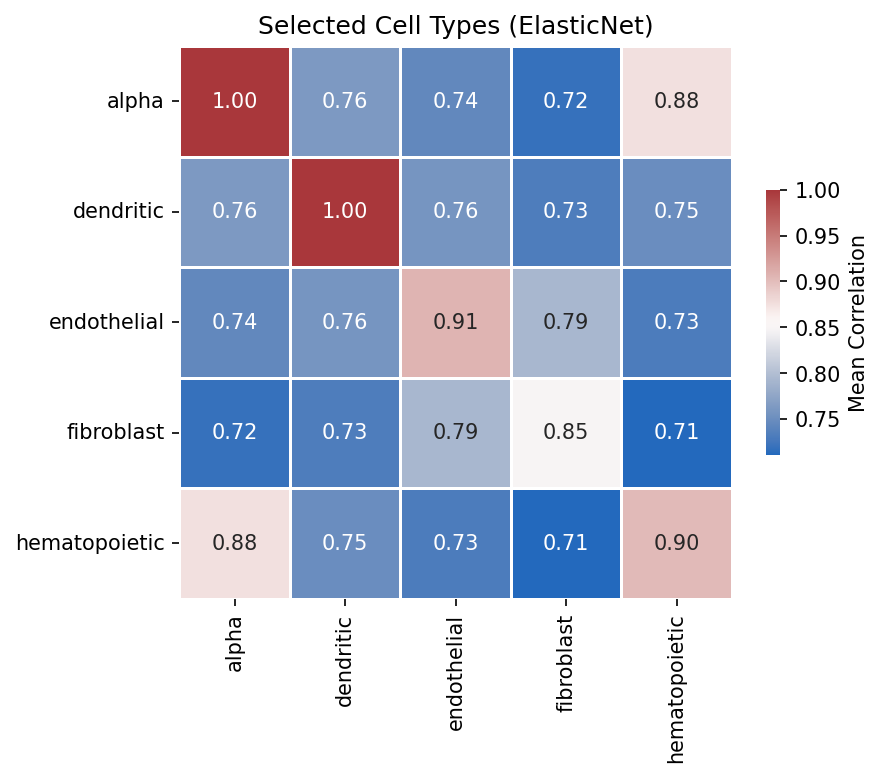

CPU times: user 266 ms, sys: 52.5 ms, total: 319 ms
Wall time: 320 ms


In [22]:
%%time
selected_types = plot_df.index.to_list()
print(f"{len(selected_types)=}")

X = rdata[rdata.obs['cell_type'].isin(selected_types), :].to_df()
corr = X.T.corr()
print(f"Mean correlation between selected cell types: {np.mean(corr):.4f}")

corr = corr.reset_index()
corr = pd.melt(corr, id_vars='index')
corr['index'] = corr['index'].map(cell2label)
corr['variable'] = corr['variable'].map(cell2label)
corr = corr.groupby(['index', 'variable'])['value'].mean().reset_index()
corr = pd.pivot_table(
    corr, index='index',
    columns='variable',
    values='value',
)

# 3. Plot
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 6, 6

sns.heatmap(
    corr,
    annot=True,
    cmap='vlag',
    square=True,
    linewidths=0.5,
    cbar_kws={'label': 'Mean Correlation', 'shrink' : 0.35},
    fmt=".2f"
)
plt.title('Selected Cell Types (ElasticNet)')
plt.ylabel('')
plt.xlabel('')
plt.tight_layout()
plt.show()

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


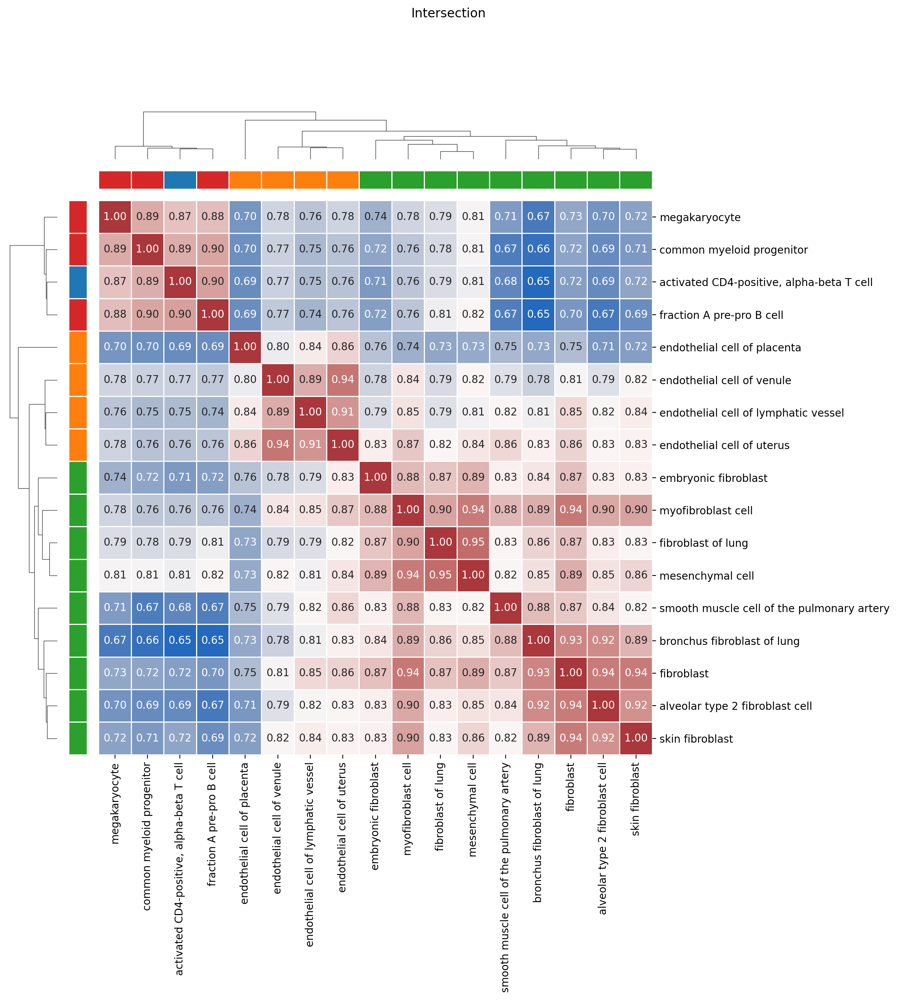

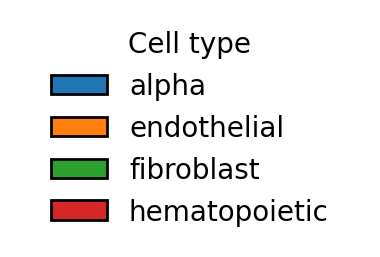

CPU times: user 1.4 s, sys: 366 ms, total: 1.76 s
Wall time: 1.77 s


In [23]:
%%time
X = rdata[rdata.obs['cell_type'].isin(overlap), :].to_df()
corr = X.T.corr()

# get colors
row_values = corr.index.map(cell2label)
unique_row_values = sorted(set(row_values))
palette = sns.color_palette('tab10', n_colors=len(unique_row_values))
row_color_dict = dict(zip(unique_row_values, palette))
row_colors = [row_color_dict[v] for v in row_values]

plt.rcParams['figure.dpi'] = 200

sns.clustermap(
    corr,
    row_colors=row_colors,
    col_colors=row_colors,
    annot=True,
    cmap='vlag',
    square=True,
    figsize=(12, 12),
    linewidths=0.5,
    cbar_pos=None,
    dendrogram_ratio=(0.08, 0.08),  # Smaller dendrograms (row, col)
    fmt=".2f"
)
plt.ylabel('')
plt.xlabel('')
plt.tight_layout()
fig = plt.gcf()
fig.suptitle("Intersection", y=1.1)
plt.show()

# Your unique categories and their colors
legend_labels = unique_row_values  # e.g., ['alpha', 'dendritic', 'endothelial', ...]
legend_colors = [row_color_dict[v] for v in legend_labels]

# Build legend handles
handles = [Patch(facecolor=color, edgecolor='black', label=label)
           for label, color in zip(legend_labels, legend_colors)]

# Plot standalone legend
fig, ax = plt.subplots(figsize=(2, len(handles) * 0.3))
ax.axis('off')  # Hide axes
legend = ax.legend(
    handles=handles,
    loc='center',
    frameon=False,
    ncol=1,
    title="Cell type"
)
plt.tight_layout()
plt.show()

/nfs/turbo/umms-indikar/Cooper/conda_envs/rapids/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


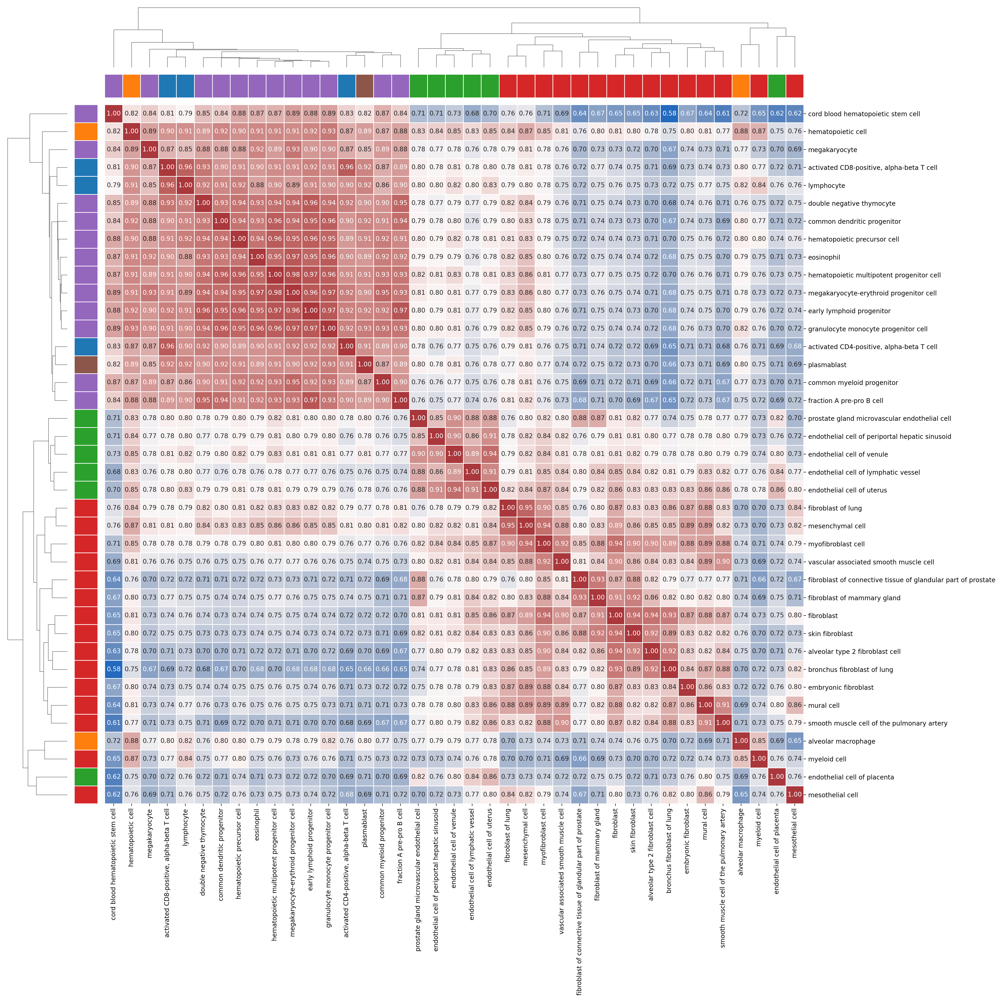

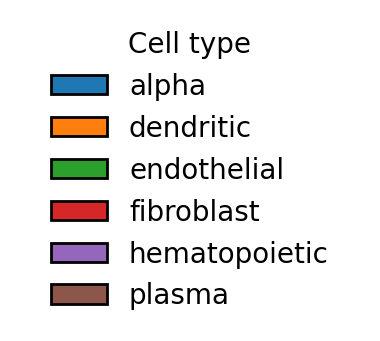

CPU times: user 4.6 s, sys: 1.15 s, total: 5.75 s
Wall time: 5.77 s


In [24]:
%%time
X = rdata[rdata.obs['cell_type'].isin(union_of_all), :].to_df()
corr = X.T.corr()

# get colors
row_values = corr.index.map(cell2label)
unique_row_values = sorted(set(row_values))
palette = sns.color_palette('tab10', n_colors=len(unique_row_values))
row_color_dict = dict(zip(unique_row_values, palette))
row_colors = [row_color_dict[v] for v in row_values]

plt.rcParams['figure.dpi'] = 200

sns.clustermap(
    corr,
    row_colors=row_colors,
    col_colors=row_colors,
    annot=True,
    cmap='vlag',
    square=True,
    figsize=(22, 22),
    linewidths=0.5,
    cbar_pos=None,
    dendrogram_ratio=(0.08, 0.08),  # Smaller dendrograms (row, col)
    fmt=".2f"
)
plt.ylabel('')
plt.xlabel('')
plt.tight_layout()
fig.suptitle("Union", y=1.1)
plt.show()

# Your unique categories and their colors
legend_labels = unique_row_values  # e.g., ['alpha', 'dendritic', 'endothelial', ...]
legend_colors = [row_color_dict[v] for v in legend_labels]

# Build legend handles
handles = [Patch(facecolor=color, edgecolor='black', label=label)
           for label, color in zip(legend_labels, legend_colors)]

# Plot standalone legend
fig, ax = plt.subplots(figsize=(2, len(handles) * 0.3))
ax.axis('off')  # Hide axes
legend = ax.legend(
    handles=handles,
    loc='center',
    frameon=False,
    ncol=1,
    title="Cell type"
)
plt.tight_layout()
plt.show()

# Sensitivity ($\alpha$)

In [25]:
%%time
threshold = 0.001

alphas = np.linspace(0.01, 0.5, 25)    # 8 steps (adjust as needed)
l1_ratio = 1.0

results = []

for alpha in tqdm(alphas, r'$\alpha$ sweep...'):
    weights_df, errors = fit_elasticnet_deconvolution(
        rdata, 
        sdata,
        alpha=alpha,
        l1_ratio=l1_ratio,
    )
    weights_df = weights_df.T.copy()
    weights_df = weights_df.loc[(weights_df > threshold).any(axis=1)]
    cdf = pd.DataFrame({
        'cell_type' : weights_df.index,
        'mean_coeff' : weights_df.mean(axis=1),
    })
    cdf['alpha'] = alpha
    cdf['l1_ratio'] = l1_ratio
    results.append(cdf)

# Concatenate all results into a single DataFrame
results = pd.concat(results, ignore_index=True)
results.head()

$\alpha$ sweep...: 100%|██████████| 25/25 [00:13<00:00,  1.88it/s]

CPU times: user 55.3 s, sys: 239 ms, total: 55.5 s
Wall time: 13.3 s


,cell_type,mean_coeff,alpha,l1_ratio
0,"activated CD4-positive, alpha-beta T cell",0.024445,0.01,1.0
1,alveolar macrophage,0.070049,0.01,1.0
2,alveolar type 2 fibroblast cell,0.088595,0.01,1.0
3,common dendritic progenitor,0.005082,0.01,1.0
4,cord blood hematopoietic stem cell,0.094593,0.01,1.0


Text(0.5, 0, '$\\alpha$ Threshold')

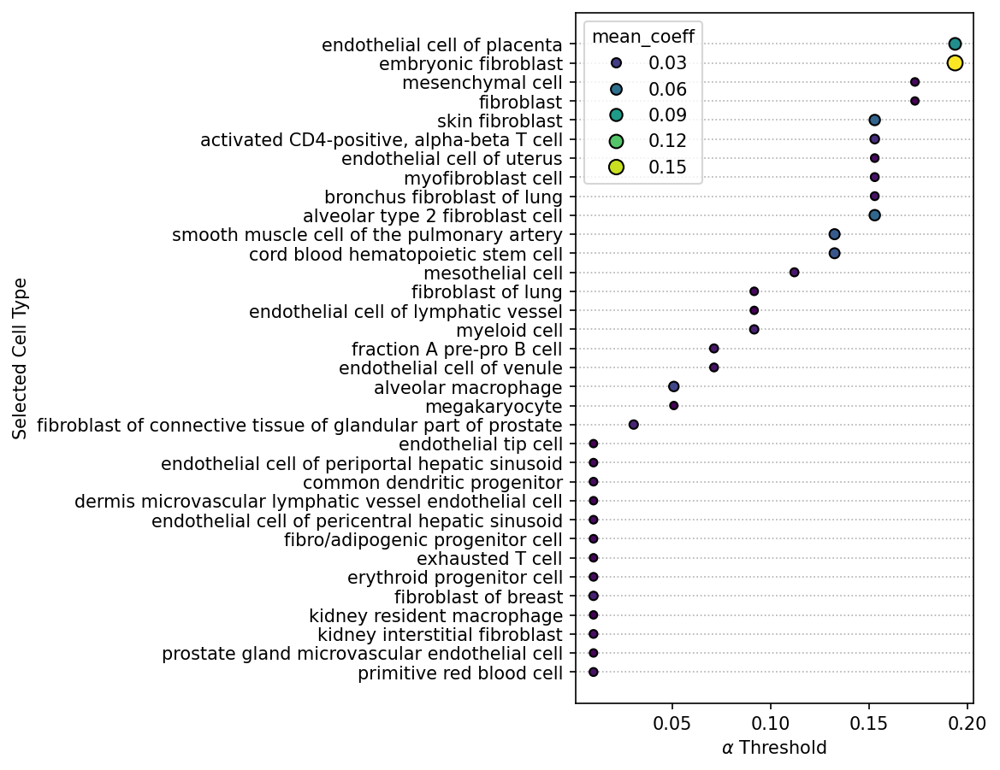

In [26]:
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = 4, 7

results.groupby('cell_type').agg(
        alpha_cutoff = ('alpha', 'max'),
        mean_coeff = ('mean_coeff', 'mean'),
    ).reset_index().sort_values(by='alpha_cutoff', ascending=False,)

ax = sns.scatterplot(
    results.groupby('cell_type').agg(
        alpha_cutoff = ('alpha', 'max'),
        mean_coeff = ('mean_coeff', 'mean'),
    ).reset_index().sort_values(by='alpha_cutoff', ascending=False,),
    x='alpha_cutoff',
    y='cell_type',
    hue='mean_coeff',
    size='mean_coeff',
    palette='viridis',
    ec='k',
    lw=1,
    zorder=5,
)

ax.grid(axis='y', linestyle=":", zorder=0)
ax.set_ylabel("Selected Cell Type")
ax.set_xlabel(r"$\alpha$ Threshold")


# Maximize Spread
## Selecting a Diverse, High-Similarity Subset from a Reference Matrix

This method selects a subset of `k` rows from a reference matrix (`rdata`) such that:
- Each selected row is highly correlated with any row from a query matrix (`sdata`)
- The selected rows are **not highly correlated with each other** (i.e., they are diverse)

### Mathematical Formulation

Let:
- $X_{\text{query}} \in \mathbb{R}^{n_q \times d}$ be the query matrix (`sdata`)
- $X_{\text{ref}} \in \mathbb{R}^{n_r \times d}$ be the reference matrix (`rdata`)
- $k$: number of rows to select
- $\lambda$: diversity penalty coefficient

For each row $i$ in `rdata`, define:

- **Similarity to query:**

  $$
  S_i = \max_{j} \ \mathrm{corr}(X_{\text{ref}}[i, :], X_{\text{query}}[j, :])
  $$

- **Penalty for redundancy:**

  $$
  P_i = \max_{s \in S} \ \mathrm{corr}(X_{\text{ref}}[i, :], X_{\text{ref}}[s, :])
  $$

  where $S$ is the set of already-selected indices (empty at first).

At each step, select the row $i^*$ with the maximum score:

$$
i^* = \arg\max_{i \notin S} \left[ S_i - \lambda P_i \right]
$$

Add $i^*$ to $S$. Repeat until $|S| = k$.

---

### Parameter Explanation

- **k**  
  Number of rows to select.  
  - Higher $k$ includes more rows, but potentially more redundancy.
  - Lower $k$ yields a smaller, more exclusive set.

- **lambda ($\lambda$)**  
  Trade-off parameter between *similarity to query* and *internal diversity*.  
  - $\lambda = 0$: Selects only the most similar rows, ignores redundancy.
  - $\lambda > 0$: Penalizes redundancy; larger values enforce more diversity.
  - Too high $\lambda$: May select less relevant but highly diverse rows.

---

In [27]:
print(f"{sdata.shape=} {type(sdata)=}")
print(f"{rdata.shape=} {type(rdata)=}")

sdata.shape=(5, 16609) type(sdata)=<class 'anndata._core.anndata.AnnData'>
rdata.shape=(188, 16609) type(rdata)=<class 'anndata._core.anndata.AnnData'>


In [28]:
%%time

def cupy_standardize(X):
    mean = cp.mean(X, axis=1, keepdims=True)
    std = cp.std(X, axis=1, keepdims=True)
    return (X - mean) / std

def cupy_corr_matrix(X, Y):
    X = cupy_standardize(X)
    Y = cupy_standardize(Y)
    return X @ Y.T / X.shape[1]

def select_diverse_subset_gpu_return_obs_names(sdata, rdata, k=10, lam=0.5):
    X_query = cp.array(sdata.X)
    X_ref = cp.array(rdata.X)
    n_ref = X_ref.shape[0]

    corr_to_query = cupy_corr_matrix(X_ref, X_query)    # (n_ref, n_query)
    max_corr_to_query = cp.max(corr_to_query, axis=1)   # (n_ref,)

    corr_within = cupy_corr_matrix(X_ref, X_ref)        # (n_ref, n_ref)
    cp.fill_diagonal(corr_within, 0)

    selected = []
    available = set(range(n_ref))
    while len(selected) < k and available:
        if not selected:
            penalty = cp.zeros(n_ref)
        else:
            penalty = cp.max(corr_within[:, cp.array(selected)], axis=1)
        scores = max_corr_to_query - lam * penalty
        mask = cp.array([i in available for i in range(n_ref)])
        scores_masked = cp.where(mask, scores, -cp.inf)
        best_idx = int(cp.argmax(scores_masked).get())
        selected.append(best_idx)
        available.remove(best_idx)
    # Return obs_names as a Python list
    return rdata.obs_names[selected].to_list()

selected_obs_names = select_diverse_subset_gpu_return_obs_names(sdata, rdata, k=25, lam=0.75)
print(f"{len(selected_obs_names)=}")
selected_obs_names

len(selected_obs_names)=25
CPU times: user 57.4 ms, sys: 6.87 ms, total: 64.3 ms
Wall time: 71.7 ms


['embryonic fibroblast',
 'activated CD4-positive, alpha-beta T cell',
 'myeloid cell',
 'endothelial cell of venule',
 'skin fibroblast',
 'smooth muscle cell of the pulmonary artery',
 'endothelial cell of placenta',
 'endothelial tip cell',
 'mesothelial cell',
 'mesenchymal cell',
 'kidney resident macrophage',
 'hematopoietic cell',
 'bronchus fibroblast of lung',
 'erythroblast',
 'alveolar type 2 fibroblast cell',
 'myofibroblast cell',
 'fibroblast of breast',
 'endothelial cell of pericentral hepatic sinusoid',
 'fibroblast of connective tissue of glandular part of prostate',
 'fibroblast',
 'endothelial cell of lymphatic vessel',
 'megakaryocyte',
 'lymphoid lineage restricted progenitor cell',
 'mural cell',
 'alveolar macrophage']

# determine reference types

In [55]:
%%time
X = rdata[rdata.obs['cell_type'].isin(union_of_all), :].to_df()
corr = X.T.corr()

# Compute linkage matrix
Z = linkage(corr, method='average', metric='correlation')

# Choose number of clusters (e.g., k=5)
k = 7
labels = fcluster(Z, k, criterion='maxclust')

# Create mapping from cluster label to list of row indices
clusters = defaultdict(list)
for idx, cluster_label in zip(corr.index, labels):
    clusters[cluster_label].append(idx)

# Convert to dict if needed
clusters = dict(clusters)
clusters

CPU times: user 81.5 ms, sys: 0 ns, total: 81.5 ms
Wall time: 80.8 ms


{1: ['activated CD4-positive, alpha-beta T cell',
  'activated CD8-positive, alpha-beta T cell',
  'common dendritic progenitor',
  'common myeloid progenitor',
  'cord blood hematopoietic stem cell',
  'double negative thymocyte',
  'early lymphoid progenitor',
  'eosinophil',
  'fraction A pre-pro B cell',
  'granulocyte monocyte progenitor cell',
  'hematopoietic cell',
  'hematopoietic multipotent progenitor cell',
  'hematopoietic precursor cell',
  'lymphocyte',
  'megakaryocyte',
  'megakaryocyte-erythroid progenitor cell',
  'plasmablast'],
 2: ['alveolar macrophage', 'myeloid cell'],
 5: ['alveolar type 2 fibroblast cell',
  'bronchus fibroblast of lung',
  'embryonic fibroblast',
  'fibroblast',
  'fibroblast of connective tissue of glandular part of prostate',
  'fibroblast of mammary gland',
  'mural cell',
  'myofibroblast cell',
  'skin fibroblast',
  'smooth muscle cell of the pulmonary artery',
  'vascular associated smooth muscle cell'],
 3: ['endothelial cell of lymph

# Hand mapping

In [56]:
# Build reverse mapping: cell_type → group
cell_type_to_group = {}
for group, cell_types in clusters.items():
    for ct in cell_types:
        cell_type_to_group[ct] = f"{group}"

# Map each row's cell_type to its group, or 'other' if not found
rdata.obs['cell_group'] = rdata.obs['cell_type'].map(cell_type_to_group)
print(rdata.obs['cell_group'].value_counts(dropna=False).to_string())
print()
print()

rdata.obs['group_label'] = rdata.obs['cell_group'].astype(str) + ";" + rdata.obs['cell_type'].astype(str)

cell_group
NaN    149
1       17
5       11
3        5
2        2
6        2
4        1
7        1




# Aggregate, and output

In [57]:
%%time
outpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/capybara/reference.h5ad"

agg = 'mean'

aggdata = sc.get.aggregate(
    rdata[rdata.obs['cell_group'].notna(), :].copy(),
    by='group_label',
    func=agg,
)

aggdata.X = aggdata.layers[agg]
del aggdata.layers[agg]
print(f"{aggdata.shape=}")
aggdata.write(outpath)
aggdata.obs.head()

aggdata.shape=(39, 16609)
CPU times: user 40.9 ms, sys: 5.69 ms, total: 46.6 ms
Wall time: 83.3 ms


,group_label
"1;activated CD4-positive, alpha-beta T cell","1;activated CD4-positive, alpha-beta T cell"
"1;activated CD8-positive, alpha-beta T cell","1;activated CD8-positive, alpha-beta T cell"
1;common dendritic progenitor,1;common dendritic progenitor
1;common myeloid progenitor,1;common myeloid progenitor
1;cord blood hematopoietic stem cell,1;cord blood hematopoietic stem cell


In [32]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

# Now on Single Cells

In [ ]:
%%time
selected_types, stats = select_mapped_types(
    adata, 
    rdata,
    threshold_pct=999, 
    min_freq=0.1
    
)
print(f"{len(selected_types)=}")
for x in selected_types:
    print(x)

In [ ]:
stats['cluster_label'] = stats['cell_type'].map(cell2label)
stats[stats['selected']]['cluster_label'].value_counts()

In [ ]:
break